In [1]:
import tensorflow as tf

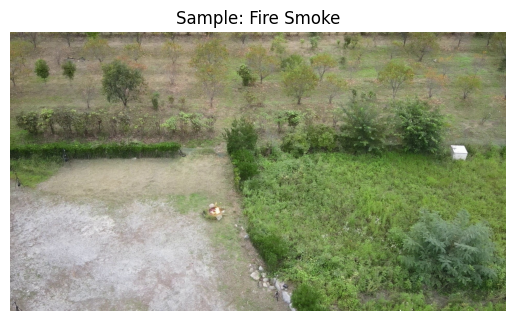

화재 이미지 개수: 452
일반 이미지 개수: 358


In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as img
import os

# 데이터 경로 설정
fire_smoke_dir = 'data/fire_smoke'
negative_dir = 'data/negative'

# 임시 출력
fire_smoke_files = os.listdir(fire_smoke_dir)
sample_img_path = os.path.join(fire_smoke_dir, fire_smoke_files[0])
sample_img = img.imread(sample_img_path)

plt.imshow(sample_img)
plt.title("Sample: Fire Smoke")
plt.axis('off')
plt.show()

print(f"화재 이미지 개수: {len(os.listdir(fire_smoke_dir))}")
print(f"일반 이미지 개수: {len(os.listdir(negative_dir))}")

In [3]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import preprocess_input

# 1. 모델 로드 시 custom_objects를 정확히 지정합니다.
model_path = 'my_resnet_goal.keras'

try:
    model = tf.keras.models.load_model(
        model_path,
        custom_objects={'preprocess_input': preprocess_input}
    )
    print("모델 로드 성공!")
except Exception as e:
    print(f"모델 로드 실패: {e}")

# 이후에 imread_korean 함수와 예측 코드를 실행하세요.

모델 로드 성공!


In [4]:
import cv2
import numpy as np

# --- 한글 경로를 포함한 이미지를 읽어오는 안전한 방법 ---
def imread_korean(path):
    with open(path, "rb") as f:
        chunk = np.frombuffer(f.read(), dtype=np.uint8)
        return cv2.imdecode(chunk, cv2.IMREAD_COLOR)

# 경로를 다시 설정 (절대 경로인지 확인하세요!)
img_path = '/Users/iseung-eun/Desktop/e-gleEye/data/fire_smoke/0005_SM_GAH_00351.jpg'

frame = imread_korean(img_path)

if frame is None:
    print(f"이미지를 불러오지 못했습니다. 경로를 확인하세요: {img_path}")
else:
    # 1. 색상 변환
    img_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    # 2. 이미지 리사이즈
    img_resized = cv2.resize(img_rgb, (224, 224))
    # 3. 차원 추가
    img_array = np.expand_dims(img_resized, axis=0)
    
    # 4. 정규화 및 전처리
    from tensorflow.keras.applications.resnet50 import preprocess_input
    img_ready = preprocess_input(img_array.astype(np.float32))

    # *** PREDICTION ***
    preds = model.predict(img_ready, verbose=0)
    print("예측 성공!")
    print(preds)

예측 성공!
[[0.35281113 0.64718896]]


In [5]:
# 1. 색상 변환
img_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# 2. 이미지 리사이즈 (224x224)
img_resized = cv2.resize(img_rgb, (224, 224))

# 3. 차원 추가 (Batch size 추가)
img_array = np.expand_dims(img_resized, axis=0).astype(np.float32)

print("--- 예측 결과 비교 ---")

# [방법 A] 모델 내부의 Lambda 층(전처리)을 믿고 생 이미지를 넣기
# 모델이 알아서 preprocess_input을 수행함
preds_A = model.predict(img_array, verbose=0)
print(f"방법 A (원본 투입) 확률: {preds_A[0]}")
print(f"방법 A 최종 인덱스: {np.argmax(preds_A[0])}")

print("-" * 30)

# [방법 B] 혹시 모르니 밖에서 전처리를 해서 넣어보기
# 모델 내부에서 또 전처리가 일어나면 중복 전처리가 됨
from tensorflow.keras.applications.resnet50 import preprocess_input
img_ready = preprocess_input(img_array.copy())
preds_B = model.predict(img_ready, verbose=0)
print(f"방법 B (전처리 후 투입) 확률: {preds_B[0]}")
print(f"방법 B 최종 인덱스: {np.argmax(preds_B[0])}")

--- 예측 결과 비교 ---
방법 A (원본 투입) 확률: [0.97533697 0.02466301]
방법 A 최종 인덱스: 0
------------------------------
방법 B (전처리 후 투입) 확률: [0.35281113 0.64718896]
방법 B 최종 인덱스: 1


In [6]:
import os
import cv2
import numpy as np

data_dir = 'data'
repaired = 0
failed = 0

for root, dirs, files in os.walk(data_dir):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            file_path = os.path.join(root, file)
            try:
                # 1. 한글 경로 대응해서 읽기
                with open(file_path, "rb") as f:
                    chunk = np.frombuffer(f.read(), dtype=np.uint8)
                    img = cv2.imdecode(chunk, cv2.IMREAD_COLOR)
                
                if img is not None:
                    # 2. 깨끗한 정규 JPEG 포맷으로 다시 저장 (덮어쓰기)
                    is_success, buffer = cv2.imencode(".jpg", img)
                    if is_success:
                        with open(file_path, "wb") as f:
                            f.write(buffer)
                        repaired += 1
                else:
                    failed += 1
            except:
                failed += 1

print(f"수리 완료: {repaired}개 | 수리 불가(진짜 깨짐): {failed}개")

수리 완료: 846개 | 수리 불가(진짜 깨짐): 0개


In [ ]:
import os

data_dir = 'data'
deleted = 0

for root, dirs, files in os.walk(data_dir):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            file_path = os.path.join(root, file)
            try:
                # 1. 다시 읽어보기 시도
                with open(file_path, "rb") as f:
                    chunk = np.frombuffer(f.read(), dtype=np.uint8)
                    img = cv2.imdecode(chunk, cv2.IMREAD_COLOR)
                
                # 2. 읽기에 실패했다면 파일 삭제
                if img is None:
                    os.remove(file_path)
                    print(f" 삭제됨 (깨진 파일): {file}")
                    deleted += 1
            except:
                if os.path.exists(file_path):
                    os.remove(file_path)
                    deleted += 1

print(f"--- 청소 완료 ---")
print(f"삭제된 파일 총 개수: {deleted}개")

--- 청소 완료 ---
삭제된 파일 총 개수: 0개


In [8]:
import os
import gc # Garbage Collector (메모리 관리자)
from PIL import Image

def safe_deep_clean(root_dir):
    print("안전 모드 딥 클리닝 시작...")
    count = 0
    error_count = 0
    
    # 처리할 파일 목록 미리 수집
    file_list = []
    for subdir, dirs, files in os.walk(root_dir):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                file_list.append(os.path.join(subdir, file))
    
    total = len(file_list)
    
    for i, file_path in enumerate(file_list):
        try:
            # 'with' 문을 사용하여 파일 핸들을 확실히 닫음
            with Image.open(file_path) as img:
                rgb_img = img.convert('RGB')
                rgb_img.save(file_path, "JPEG", quality=90)
            
            count += 1
            
            # 50장마다 메모리 강제 정리 및 진행률 표시
            if count % 50 == 0:
                gc.collect() 
                print(f"진행 중: {count}/{total} 완료...")
                
        except Exception as e:
            print(f"오류 발생(삭제): {file_path} - {e}")
            if os.path.exists(file_path):
                os.remove(file_path)
            error_count += 1
            
    print(f"\n정제 완료: {count}개 성공 / {error_count}개 삭제")

# 다시 실행하기 전 Kernel -> Restart를 꼭 해주세요!
safe_deep_clean('data')

안전 모드 딥 클리닝 시작...
진행 중: 50/846 완료...
진행 중: 100/846 완료...
진행 중: 150/846 완료...
진행 중: 200/846 완료...
진행 중: 250/846 완료...
진행 중: 300/846 완료...
진행 중: 350/846 완료...
진행 중: 400/846 완료...
진행 중: 450/846 완료...
진행 중: 500/846 완료...
진행 중: 550/846 완료...
진행 중: 600/846 완료...
진행 중: 650/846 완료...
진행 중: 700/846 완료...
진행 중: 750/846 완료...
진행 중: 800/846 완료...

정제 완료: 846개 성공 / 0개 삭제


In [9]:
# 원본 규격을 강제로 244x244로 맞추는 모델
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

# 1. 데이터셋 설정
data_dir = 'data' 
batch_size = 16 
img_height = 224
img_width = 224

# 클래스 지정
class_names = ['fire_smoke', 'negative']

train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir, validation_split=0.2, subset="training", seed=123,
    image_size=(img_height, img_width), batch_size=batch_size, 
    label_mode='categorical', class_names=class_names
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir, validation_split=0.2, subset="validation", seed=123,
    image_size=(img_height, img_width), batch_size=batch_size, 
    label_mode='categorical', class_names=class_names
)

data_augmentation = models.Sequential([
    layers.RandomFlip("horizontal"), 
    layers.RandomRotation(0.1),                  
    layers.RandomZoom(0.1),                       
    layers.RandomBrightness(0.2),
    layers.RandomContrast(0.2), # 웹캠의 조명 변화에 대비
])

# 최적화
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)

# 2. 모델 설계
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False 

model = models.Sequential([
    layers.Input(shape=(224, 224, 3)),
    data_augmentation,          
    layers.Lambda(preprocess_input, name='resnet_preprocess'), 
    base_model,                 
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'), 
    layers.Dropout(0.5),
    layers.Dense(2, activation='softmax') 
])

# 3. 컴파일
model.compile(optimizer=tf.keras.optimizers.Adam(1e-3), # 표준 학습률
              loss='categorical_crossentropy', 
              metrics=['accuracy', tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall')])

# 가중치 조절
class_weights = {0: 1.0, 1: 5.0} 

# 4. 1단계 학습
print("1단계 학습 시작 (상부 레이어 학습)...")
model.fit(
    train_ds, 
    validation_data=val_ds, 
    epochs=10,            
    class_weight=class_weights
)
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', 
    patience=5,             # 5번의 에포크 동안 개선 안 되면 멈춤
    restore_best_weights=True
)

# 5. 2단계 파인튜닝
print("\n2단계 파인튜닝 시작 (정밀 학습)...")
base_model.trainable = True
# 뒤쪽 30개 레이어만 풀어서 미세 조정
for layer in base_model.layers[:-30]:
    layer.trainable = False
# 학습률 낮게 설정하여 학습 진행
model.compile(optimizer=tf.keras.optimizers.Adam(1e-5), 
              loss='categorical_crossentropy', 
              metrics=['accuracy', tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall')])


history = model.fit(
    train_ds, 
    validation_data=val_ds, 
    epochs=20, # 충분히 학습
    class_weight=class_weights 
)

# 6. 모델 저장
model.save('resnet50_squash_model.keras')
print("모델 저장 완료")

Found 810 files belonging to 2 classes.
Using 648 files for training.
Found 810 files belonging to 2 classes.
Using 162 files for validation.


KeyboardInterrupt: 

In [ ]:
# 원본 규격을 패딩 줘서 244x244로 맞추는 모델
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

# 1. 데이터셋 설정
data_dir = 'data' 
batch_size = 16 
img_height = 224
img_width = 224

# 클래스 지정
class_names = ['fire_smoke', 'negative']

train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir, validation_split=0.2, subset="training", seed=123,
    batch_size=batch_size, 
    label_mode='categorical', class_names=class_names,
    image_size=(img_height, img_width),
    crop_to_aspect_ratio=True
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir, validation_split=0.2, subset="validation", seed=123,
    image_size=(img_height, img_width), batch_size=batch_size, 
    label_mode='categorical', class_names=class_names,
    crop_to_aspect_ratio=True
)

data_augmentation = models.Sequential([
    layers.RandomFlip("horizontal"), 
    layers.RandomRotation(0.1),                  
    layers.RandomZoom(0.1),                       
    layers.RandomBrightness(0.2),
    layers.RandomContrast(0.2), # 웹캠의 조명 변화에 대비
])

# 최적화
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)

# 2. 모델 설계
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False 

model = models.Sequential([
    layers.Input(shape=(224, 224, 3)),
    data_augmentation,          
    layers.Lambda(preprocess_input, name='resnet_preprocess'), 
    base_model,                 
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'), 
    layers.Dropout(0.5),
    layers.Dense(2, activation='softmax') 
])

# 3. 컴파일
model.compile(optimizer=tf.keras.optimizers.Adam(1e-3), # 표준 학습률
              loss='categorical_crossentropy', 
              metrics=['accuracy', tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall')])

# 가중치 조절
class_weights = {0: 1.0, 1: 5.0} 

# 4. 1단계 학습
print("1단계 학습 시작 (상부 레이어 학습)...")
model.fit(
    train_ds, 
    validation_data=val_ds, 
    epochs=10,            
    class_weight=class_weights
)
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', 
    patience=5,             # 5번의 에포크 동안 개선 안 되면 멈춤
    restore_best_weights=True
)

# 5. 2단계 파인튜닝
print("\n2단계 파인튜닝 시작 (정밀 학습)...")
base_model.trainable = True
# 뒤쪽 30개 레이어만 풀어서 미세 조정
for layer in base_model.layers[:-30]:
    layer.trainable = False
# 학습률 낮게 설정하여 학습 진행
model.compile(optimizer=tf.keras.optimizers.Adam(1e-5), 
              loss='categorical_crossentropy', 
              metrics=['accuracy', tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall')])


history = model.fit(
    train_ds, 
    validation_data=val_ds, 
    epochs=20, # 충분히 학습
    class_weight=class_weights 
)

# 6. 모델 저장
model.save('resnet50_crop_model.keras')
print("모델 저장 완료")

Found 810 files belonging to 2 classes.
Using 648 files for training.
Found 810 files belonging to 2 classes.
Using 162 files for validation.
1단계 학습 시작 (상부 레이어 학습)...
Epoch 1/10
41/41 ━━━━━━━━━━━━━━━━━━━━ 33s 627ms/step - accuracy: 0.6713 - loss: 1.9272 - precision: 0.6713 - recall: 0.6713 - val_accuracy: 0.9383 - val_loss: 0.1799 - val_precision: 0.9383 - val_recall: 0.9383
Epoch 2/10
41/41 ━━━━━━━━━━━━━━━━━━━━ 23s 561ms/step - accuracy: 0.8426 - loss: 0.6295 - precision: 0.8426 - recall: 0.8426 - val_accuracy: 0.9691 - val_loss: 0.1306 - val_precision: 0.9691 - val_recall: 0.9691
Epoch 3/10
41/41 ━━━━━━━━━━━━━━━━━━━━ 23s 559ms/step - accuracy: 0.8935 - loss: 0.4121 - precision: 0.8935 - recall: 0.8935 - val_accuracy: 0.9259 - val_loss: 0.1538 - val_precision: 0.9259 - val_recall: 0.9259
Epoch 4/10
41/41 ━━━━━━━━━━━━━━━━━━━━ 22s 550ms/step - accuracy: 0.8966 - loss: 0.3996 - precision: 0.8966 - recall: 0.8966 - val_accuracy: 0.9630 - val_loss: 0.1112 - val_precision: 0.9630 - val_reca

In [10]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

# 1. 데이터셋 설정
data_dir = 'data' 
batch_size = 16 
img_height = 224
img_width = 224
class_names = ['fire_smoke', 'negative']

# 이미지를 패딩 처리하는 함수 정의
def apply_padding(image, label):
    # 비율을 유지하며 224x224로 맞추고 남는 공간은 검은색(0)으로 채움
    image = tf.image.resize_with_pad(image, img_height, img_width)
    return image, label

# 데이터셋 로드 
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir, validation_split=0.2, subset="training", seed=123,
    image_size=(img_height, img_width), batch_size=batch_size, 
    label_mode='categorical', class_names=class_names
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir, validation_split=0.2, subset="validation", seed=123,
    image_size=(img_height, img_width), batch_size=batch_size, 
    label_mode='categorical', class_names=class_names
)

train_ds = train_ds.map(apply_padding)
val_ds = val_ds.map(apply_padding)

# 데이터 증강 
data_augmentation = models.Sequential([
    layers.RandomFlip("horizontal"), 
    layers.RandomRotation(0.1),                  
    layers.RandomZoom(0.1),                       
    layers.RandomBrightness(0.2),
    layers.RandomContrast(0.2),
])

# 최적화
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)

# 2. 모델 설계
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False 

model = models.Sequential([
    layers.Input(shape=(224, 224, 3)),
    data_augmentation,          
    layers.Lambda(preprocess_input, name='resnet_preprocess'), 
    base_model,                 
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'), 
    layers.Dropout(0.5),
    layers.Dense(2, activation='softmax') 
])

# 3. 컴파일
model.compile(optimizer=tf.keras.optimizers.Adam(1e-3),
              loss='categorical_crossentropy', 
              metrics=['accuracy', tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall')])

class_weights = {0: 1.0, 1: 5.0} 

# 4. 1단계 학습
print("1단계 학습 시작 (상부 레이어 학습)...")
model.fit(
    train_ds, 
    validation_data=val_ds, 
    epochs=10,            
    class_weight=class_weights
)

# 5. 2단계 파인튜닝
print("\n2단계 파인튜닝 시작 (정밀 학습)...")
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(1e-5), 
              loss='categorical_crossentropy', 
              metrics=['accuracy', tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall')])

history = model.fit(
    train_ds, 
    validation_data=val_ds, 
    epochs=20, 
    class_weight=class_weights 
)

# 6. 모델 저장
model.save('resnet50_padding_model.keras')
print("모델 저장 완료")

Found 810 files belonging to 2 classes.
Using 648 files for training.
Found 810 files belonging to 2 classes.
Using 162 files for validation.
1단계 학습 시작 (상부 레이어 학습)...
Epoch 1/10
41/41 ━━━━━━━━━━━━━━━━━━━━ 31s 585ms/step - accuracy: 0.7083 - loss: 1.5551 - precision: 0.7083 - recall: 0.7083 - val_accuracy: 0.9259 - val_loss: 0.1838 - val_precision: 0.9259 - val_recall: 0.9259
Epoch 2/10
41/41 ━━━━━━━━━━━━━━━━━━━━ 22s 535ms/step - accuracy: 0.8735 - loss: 0.5439 - precision: 0.8735 - recall: 0.8735 - val_accuracy: 0.9198 - val_loss: 0.1864 - val_precision: 0.9198 - val_recall: 0.9198
Epoch 3/10
41/41 ━━━━━━━━━━━━━━━━━━━━ 22s 541ms/step - accuracy: 0.9012 - loss: 0.3989 - precision: 0.9012 - recall: 0.9012 - val_accuracy: 0.9568 - val_loss: 0.0997 - val_precision: 0.9568 - val_recall: 0.9568
Epoch 4/10
41/41 ━━━━━━━━━━━━━━━━━━━━ 22s 527ms/step - accuracy: 0.9120 - loss: 0.3484 - precision: 0.9120 - recall: 0.9120 - val_accuracy: 0.9074 - val_loss: 0.2034 - val_precision: 0.9074 - val_reca

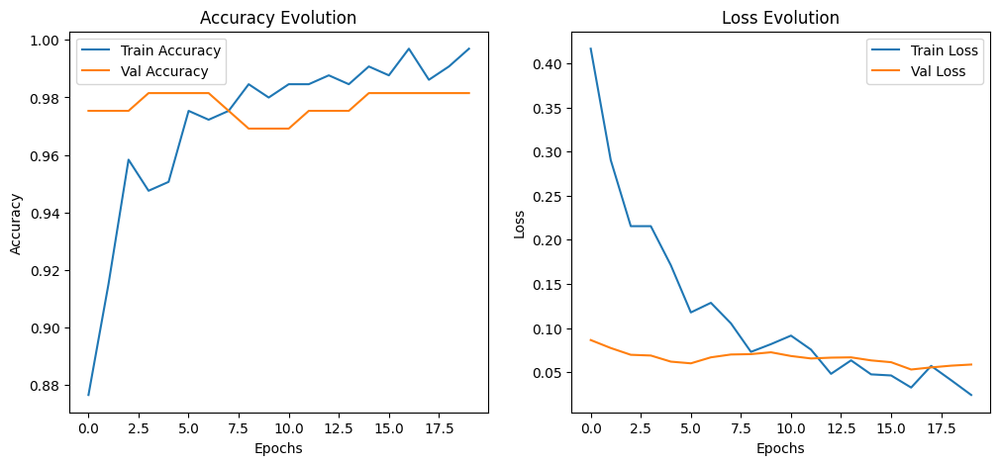

In [11]:
import matplotlib.pyplot as plt

# 정확도 그래프
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Accuracy Evolution')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# 손실 그래프
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss Evolution')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

/var/folders/4r/3tgbnnpx7nn10vy2jr56d2q40000gn/T/ipykernel_5029/1373520118.py:117: UserWarning: Glyph 4370 (\N{HANGUL CHOSEONG HIEUH}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/4r/3tgbnnpx7nn10vy2jr56d2q40000gn/T/ipykernel_5029/1373520118.py:117: UserWarning: Glyph 4458 (\N{HANGUL JUNGSEONG WA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/4r/3tgbnnpx7nn10vy2jr56d2q40000gn/T/ipykernel_5029/1373520118.py:117: UserWarning: Glyph 4363 (\N{HANGUL CHOSEONG IEUNG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/4r/3tgbnnpx7nn10vy2jr56d2q40000gn/T/ipykernel_5029/1373520118.py:117: UserWarning: Glyph 4455 (\N{HANGUL JUNGSEONG YEO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/4r/3tgbnnpx7nn10vy2jr56d2q40000gn/T/ipykernel_5029/1373520118.py:117: UserWarning: Glyph 4535 (\N{HANGUL JONGSEONG MIEUM}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/4r/3tgbnnpx7nn10vy2jr56d2q40000gn/T/ipy

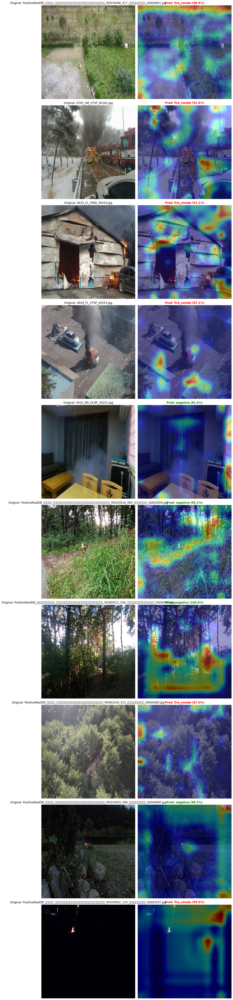

In [21]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import keras
from keras.utils import load_img, img_to_array
from keras.applications.resnet50 import preprocess_input

# 1. 모델 경로
model_path = 'my_resnet_goal.keras' 

# 2. 데이터셋 절대 경로
data_dir = '/Users/iseung-eun/Downloads/dataset_v2' 
test_target_dir = os.path.join(data_dir, 'danger') 
# 모델 로드
model = keras.models.load_model(
    model_path,
    custom_objects={'preprocess_input': preprocess_input},
    safe_mode=False
)

def get_gradcam_heatmap(img_array, model, target_layer_name='conv4_block3_out'):
    base_model = model.get_layer('resnet50')
    target_layer = base_model.get_layer(target_layer_name)
    
    new_model = keras.Model(
        inputs=base_model.inputs,
        outputs=[target_layer.output, base_model.output]
    )

    with tf.GradientTape() as tape:
        x = img_array
        for layer in model.layers:
            if layer.name == 'resnet50': break
            x = layer(x)
        
        conv_outputs, base_out = new_model(x)
        
        found_resnet = False
        for layer in model.layers:
            if found_resnet: base_out = layer(base_out)
            if layer.name == 'resnet50': found_resnet = True
        
        final_output = base_out
        pred_index = tf.argmax(final_output[0])
        class_channel = final_output[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-10)
    return heatmap.numpy()

def test_with_gradcam(folder_path):
    if not os.path.exists(folder_path):
        print(f"경로를 찾을 수 없습니다: {folder_path}")
        return
        
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp')
    img_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]
    
    # 처음 10장
    if len(img_files) > 10:
        img_files = img_files[:10]
    
    if not img_files: 
        print(f"'{folder_path}' 폴더에 이미지 파일이 없습니다. 폴더 구조를 확인하세요.")
        return

    class_names = ['fire_smoke', 'negative']
    num_images = len(img_files)
    plt.figure(figsize=(12, 6 * num_images))

    for i, file_name in enumerate(img_files):
        img_path = os.path.join(folder_path, file_name)
        
        # 이미지 로드 및 전처리
        img_raw = load_img(img_path, target_size=(224, 224))
        img_array = img_to_array(img_raw)
        img_input = np.expand_dims(img_array, axis=0)
        img_input = preprocess_input(img_input)
        
        # 예측
        preds = model.predict(img_input, verbose=0)
        result_idx = np.argmax(preds[0])
        result_label = class_names[result_idx]
        confidence = preds[0][result_idx] * 100

        # Grad-CAM 히트맵
        heatmap = get_gradcam_heatmap(img_input, model)
        
        # 시각화 합성
        img_bgr = cv2.imread(img_path)
        img_bgr = cv2.resize(img_bgr, (224, 224))
        heatmap_resized = cv2.resize(heatmap, (224, 224))
        heatmap_color = np.uint8(255 * heatmap_resized)
        heatmap_color = cv2.applyColorMap(heatmap_color, cv2.COLORMAP_JET)
        
        superimposed_img = cv2.addWeighted(img_bgr, 0.6, heatmap_color, 0.4, 0)
        superimposed_img = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)

        # 시각화 출력
        plt.subplot(num_images, 2, 2*i + 1)
        plt.imshow(img_raw)
        plt.title(f"Original: {file_name}")
        plt.axis('off')

        plt.subplot(num_images, 2, 2*i + 2)
        plt.imshow(superimposed_img)
        color = 'red' if result_idx == 0 else 'green'
        plt.title(f"Pred: {result_label} ({confidence:.1f}%)", color=color, fontweight='bold')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# --- 실행 ---
test_with_gradcam(test_target_dir)

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import yt_dlp
import keras
from keras.applications.resnet50 import preprocess_input
from collections import deque
import time

# 1. 모델 로드
model_path = 'resnet50_padding_model.keras'
model = keras.models.load_model(model_path, custom_objects={'preprocess_input': preprocess_input}, safe_mode=False)

# 2. Grad-CAM 히트맵 함수
def get_gradcam_heatmap(img_array, model, target_layer_name='conv5_block3_out'):
    try:
        base_model = model.get_layer('resnet50')
        target_layer = base_model.get_layer(target_layer_name)
        grad_model = keras.Model(inputs=base_model.inputs, outputs=[target_layer.output, base_model.output])
        with tf.GradientTape() as tape:
            x = img_array
            for layer in model.layers:
                if layer.name == 'resnet50': break
                x = layer(x)
            conv_outputs, base_out = grad_model(x)
            found_resnet = False
            for layer in model.layers:
                if found_resnet: base_out = layer(base_out)
                if layer.name == 'resnet50': found_resnet = True
            pred_index = tf.argmax(base_out[0])
            class_channel = base_out[:, pred_index]
        grads = tape.gradient(class_channel, conv_outputs)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        heatmap = conv_outputs[0] @ pooled_grads[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)
        heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-10)
        return heatmap.numpy()
    except:
        return np.zeros((7, 7))

# 3. 리사이징 함수 (작은 개체를 위해 Padding 방식 유지)
def resize_with_padding(image, target_size=(224, 224)):
    h, w = image.shape[:2]
    ratio = min(target_size[0] / h, target_size[1] / w)
    new_h, new_w = int(h * ratio), int(w * ratio)
    resized = cv2.resize(image, (new_w, new_h))
    pad_h, pad_w = (target_size[0] - new_h) // 2, (target_size[1] - new_w) // 2
    return cv2.copyMakeBorder(resized, pad_h, target_size[0]-new_h-pad_h, pad_w, target_size[1]-new_w-pad_w, cv2.BORDER_CONSTANT, value=[0, 0, 0])

# 4. 실행 함수
def run_realtime_eagle_eye(video_source):
    # 민감도 설정
    FIRE_THRESHOLD = 0.20       
    EMERGENCY_COUNT = 2         # 8프레임 중 2번만 감지되어도 경보
    EMERGENCY_EWMA = 0.30       # 평균 확률 0.3만 넘어도 긴급 상황
    SAFE_EXIT_THRESHOLD = 0.05  # 아주 확실히 꺼졌을 때만 해제

    if str(video_source).startswith(('http://', 'https://')):
        ydl_opts = {'format': 'best[ext=mp4]', 'quiet': True}
        with yt_dlp.YoutubeDL(ydl_opts) as ydl:
            info = ydl.extract_info(video_source, download=False)
            video_url = info.get('url', None)
    else: video_url = video_source

    cap = cv2.VideoCapture(video_url)
    fps = cap.get(cv2.CAP_PROP_FPS) or 30
    history = deque(maxlen=8)
    ewma_prob = 0.0            
    frame_count = 0
    current_status = "NORMAL"
    status_color = (0, 255, 0)
    heatmap_overlay = None
    raw_prob = 0.0
    fire_count = 0

    print(f"\n=== E-gle Eye v5.3 가동 ===")

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret: break

        # 작은 불길을 잡기 위해 중앙 60% 영역을 '확대'해서 추가 검사하거나 
        # 전체 화면 민감 처리 
        if frame_count % int(fps/5) == 0: # 0.2초마다 검사
            img_ready = resize_with_padding(frame, (224, 224))
            img_input = preprocess_input(np.expand_dims(cv2.cvtColor(img_ready, cv2.COLOR_BGR2RGB), axis=0))

            raw_prob = model.predict(img_input, verbose=0)[0][0]
            
            # EWMA: 낮은 확률이라도 불꽃의 징후가 보이면 즉각 반응하도록 alpha를 키움
            alpha = 0.6 if raw_prob > FIRE_THRESHOLD else 0.2
            ewma_prob = (alpha * raw_prob) + ((1 - alpha) * ewma_prob)

            detected = 'fire' if raw_prob > FIRE_THRESHOLD else 'normal'
            history.append(detected)
            fire_count = history.count('fire')

            # 작은 불길 판정 로직
            if (fire_count >= EMERGENCY_COUNT or ewma_prob > EMERGENCY_EWMA) and raw_prob > SAFE_EXIT_THRESHOLD:
                current_status = "!!! EMERGENCY: FIRE !!!"
                status_color = (0, 0, 255)
            elif fire_count >= 1 or ewma_prob > 0.10:
                current_status = "WARNING: SCANNING..."
                status_color = (0, 165, 255)
            else:
                current_status = "NORMAL"
                status_color = (0, 255, 0)

            # Grad-CAM은 리소스 절약을 위해 WARNING 이상일 때만 계산 시도
            if current_status != "NORMAL":
                heatmap = get_gradcam_heatmap(img_input, model)
                heatmap_resized = cv2.resize(heatmap, (frame.shape[1], frame.shape[0]))
                heatmap_overlay = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
            else:
                heatmap_overlay = None

            print(f"[{time.strftime('%H:%M:%S')}] P:{raw_prob:.2f} | E:{ewma_prob:.2f} | C:{fire_count}/8 -> {current_status}")

        display_frame = frame.copy()
        if heatmap_overlay is not None:
            display_frame = cv2.addWeighted(frame, 0.7, heatmap_overlay, 0.3, 0)
            
        cv2.rectangle(display_frame, (10, 10), (600, 80), (0,0,0), -1) 
        cv2.putText(display_frame, f"{current_status}", (20, 55), cv2.FONT_HERSHEY_SIMPLEX, 1.2, status_color, 3)
        cv2.imshow('Fire Detection Mode', display_frame)
        
        frame_count += 1
        if cv2.waitKey(1) & 0xFF == ord('q'): break

    cap.release()
    cv2.destroyAllWindows()

# 영상 실행
run_realtime_eagle_eye("https://youtu.be/5RvUaPHz_1I")

: 

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import yt_dlp
import keras
from keras.applications.resnet50 import preprocess_input
from collections import deque
import time

# 1. 모델 로드
model_path = 'resnet50_padding_model.keras'
try:
    model = keras.models.load_model(model_path, custom_objects={'preprocess_input': preprocess_input}, safe_mode=False)
    print("모델 로드 성공")
except Exception as e:
    print(f"모델 로드 실패: {e}")

# 2. Grad-CAM 히트맵 추출 함수
def get_gradcam_heatmap(img_array, model, target_layer_name='conv5_block3_out'):
    try:
        base_model = model.get_layer('resnet50')
        target_layer = base_model.get_layer(target_layer_name)
        grad_model = keras.Model(inputs=base_model.inputs, outputs=[target_layer.output, base_model.output])
        
        with tf.GradientTape() as tape:
            x = img_array
            for layer in model.layers:
                if layer.name == 'resnet50': break
                x = layer(x)
            conv_outputs, base_out = grad_model(x)
            
            found_resnet = False
            for layer in model.layers:
                if found_resnet: base_out = layer(base_out)
                if layer.name == 'resnet50': found_resnet = True
            
            pred_index = tf.argmax(base_out[0])
            class_channel = base_out[:, pred_index]

        grads = tape.gradient(class_channel, conv_outputs)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
        heatmap = conv_outputs[0] @ pooled_grads[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)
        heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-10)
        return heatmap.numpy()
    except Exception as e:
        return np.zeros((7, 7))

# 3. 리사이징 함수 (Padding 방식)
def resize_with_padding(image, target_size=(224, 224)):
    h, w = image.shape[:2]
    ratio = min(target_size[0] / h, target_size[1] / w)
    new_h, new_w = int(h * ratio), int(w * ratio)
    resized = cv2.resize(image, (new_w, new_h))
    pad_h, pad_w = (target_size[0] - new_h) // 2, (target_size[1] - new_w) // 2
    return cv2.copyMakeBorder(resized, pad_h, target_size[0]-new_h-pad_h, pad_w, target_size[1]-new_w-pad_w, cv2.BORDER_CONSTANT, value=[0, 0, 0])

# 4. 메인 실행 함수
def run_realtime_eagle_eye(video_source):
    # 민감도 설정
    FIRE_THRESHOLD = 0.20       
    EMERGENCY_COUNT = 2         
    EMERGENCY_EWMA = 0.30       
    SAFE_EXIT_THRESHOLD = 0.05  

    if str(video_source).startswith(('http://', 'https://')):
        ydl_opts = {'format': 'best[ext=mp4]', 'quiet': True}
        with yt_dlp.YoutubeDL(ydl_opts) as ydl:
            info = ydl.extract_info(video_source, download=False)
            video_url = info.get('url', None)
    else: video_url = video_source

    cap = cv2.VideoCapture(video_url)
    fps = cap.get(cv2.CAP_PROP_FPS) or 30
    history = deque(maxlen=8)
    ewma_prob = 0.0            
    frame_count = 0
    
    # 상태 초기값
    current_status = "NORMAL"
    status_color = (0, 255, 0)
    box_label = ""
    
    detected_boxes = []
    raw_prob = 0.0

    print(f"\n E-gle Eye v5.5 (Custom Label Mode) 가동 중...")

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret: break

        if frame_count % max(1, int(fps/5)) == 0:
            img_ready = resize_with_padding(frame, (224, 224))
            img_input = preprocess_input(np.expand_dims(cv2.cvtColor(img_ready, cv2.COLOR_BGR2RGB), axis=0))

            preds = model.predict(img_input, verbose=0)
            raw_prob = preds[0][0] 
            
            alpha = 0.6 if raw_prob > FIRE_THRESHOLD else 0.2
            ewma_prob = (alpha * raw_prob) + ((1 - alpha) * ewma_prob)

            detected = 'fire' if raw_prob > FIRE_THRESHOLD else 'normal'
            history.append(detected)
            fire_count = history.count('fire')

            # --- 상태별 라벨 및 색상 정의 ---
            if (fire_count >= EMERGENCY_COUNT or ewma_prob > EMERGENCY_EWMA) and raw_prob > SAFE_EXIT_THRESHOLD:
                current_status = "!!! EMERGENCY !!!"
                box_label = f"DANGER: FIRE ({raw_prob:.2f})"
                status_color = (0, 0, 255) # 빨간색
            elif fire_count >= 1 or ewma_prob > 0.10:
                current_status = "WARNING"
                box_label = f"CHECK: SMOKE? ({raw_prob:.2f})"
                status_color = (0, 165, 255) # 주황색
            else:
                current_status = "NORMAL"
                box_label = ""
                status_color = (0, 255, 0) # 초록색

            # Heatbox 좌표 계산
            detected_boxes = []
            if current_status != "NORMAL":
                heatmap = get_gradcam_heatmap(img_input, model)
                thresh = (heatmap > 0.4).astype(np.uint8)
                thresh_resized = cv2.resize(thresh, (frame.shape[1], frame.shape[0]))
                contours, _ = cv2.findContours(thresh_resized, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                
                for cnt in contours:
                    if cv2.contourArea(cnt) > (frame.shape[0] * frame.shape[1] * 0.002):
                        detected_boxes.append(cv2.boundingRect(cnt))

        # --- 렌더링 ---
        display_frame = frame.copy()
        
        # 박스와 라벨 그리기
        for (bx, by, bw, bh) in detected_boxes:
            # 1. 사각형 박스
            cv2.rectangle(display_frame, (bx, by), (bx + bw, by + bh), status_color, 3)
            
            # 2. 라벨 텍스트 배경 (가독성을 위해)
            label_size, base_line = cv2.getTextSize(box_label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)
            cv2.rectangle(display_frame, (bx, by - label_size[1] - 10), (bx + label_size[0], by), status_color, -1)
            
            # 3. 라벨 텍스트 (박스 위)
            cv2.putText(display_frame, box_label, (bx, by - 7), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)

        # 시스템 상단 UI
        cv2.rectangle(display_frame, (10, 10), (420, 80), (0,0,0), -1) 
        cv2.putText(display_frame, f"STATUS: {current_status}", (25, 55), 
                    cv2.FONT_HERSHEY_SIMPLEX, 1.1, status_color, 3)
        
        cv2.imshow('E-gle Eye AI - Fire Detection', display_frame)
        
        frame_count += 1
        if cv2.waitKey(1) & 0xFF == ord('q'): break

    cap.release()
    cv2.destroyAllWindows()

# 실행
run_realtime_eagle_eye("https://youtu.be/5RvUaPHz_1I")


: 